# Colonia stats

In [286]:
merged_2023_2024_stations.groupby(['Alcaldia', 'Year'])['Colonia'].nunique().reset_index(name='Colonia Count').sort_values(by='Colonia Count', ascending=False).reset_index(drop=True)


,Alcaldia,Year,Colonia Count
0,Benito Juárez,2023,38
1,Benito Juárez,2024,38
2,Miguel Hidalgo,2024,28
3,Miguel Hidalgo,2023,27
4,Cuauhtémoc,2023,16
5,Cuauhtémoc,2024,16
6,Azcapotzalco,2024,10
7,Coyoacan,2023,9
8,Coyoacan,2024,9
9,Azcapotzalco,2023,6


## I will start with Benito Juarez which has the most colonias and will make my way down to the least which is Alvaro Obregon

In [288]:
merged_2023_2024_stations[merged_2023_2024_stations['Alcaldia'] == 'Benito Juárez'].groupby('Colonia')['Station_ID'].nunique().sort_values(ascending=False)

Colonia
Del Valle Norte                    17
Portales                           16
Del Valle Sur                      15
Narvarte Poniente                  15
Nápoles                            13
Narvarte                           13
Del Valle Centro                   12
San Pedro de los Pinos              9
Alamos                              9
Santa Cruz Atoyac                   7
Insurgentes Mixcoac                 7
Tlacoquemecatl del Valle            6
San Jose Insurgentes                6
Actipan                             6
Ciudad de los Deportes              5
General Pedro María Anaya           5
Ampliación Nápoles                  4
San Simón Ticuman                   4
Acacias                             4
Postal                              3
Vertiz Narvarte                     3
Xoco                                3
Letran Valle                        3
Insurgentes San Borja               3
Del valle Centro                    3
Americas Unidas                     3
Niño

In [ ]:
# Filter data for 'Benito Juárez'
benito_juarez_data = merged_2023_2024_stations[merged_2023_2024_stations['Alcaldia'] == 'Benito Juárez']

# Group by 'Colonia' and count the number of trips
trip_count_per_colonia = benito_juarez_data.groupby('Colonia').size().reset_index(name='Trip_Count')

# Sort the data by trip count
trip_count_per_colonia = trip_count_per_colonia.sort_values(by='Trip_Count', ascending=False).head(15)

# Create a bar chart
fig = px.bar(trip_count_per_colonia, x='Colonia', y='Trip_Count', title='Number of Trips per Colonia in Benito Juárez 2023-2024', labels={'Colonia': 'Colonia', 'Trip_Count': 'Number of Trips'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

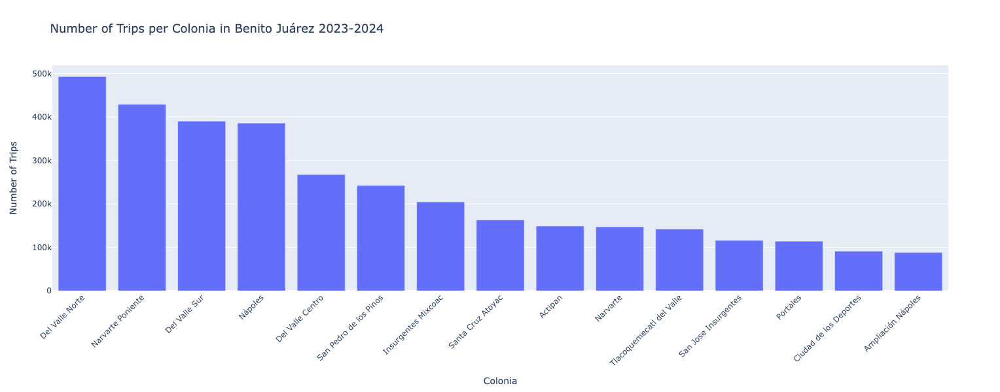

In [ ]:
# Group by 'Colonia' and count the unique Station_IDs
station_count_per_colonia = benito_juarez_data.groupby('Colonia')['Station_ID'].nunique().reset_index(name='Station_Count')

# Sort the data by station count
station_count_per_colonia = station_count_per_colonia.sort_values(by='Station_Count', ascending=False).head(15)

# Create a bar chart
fig = px.bar(station_count_per_colonia, x='Colonia', y='Station_Count', title='Number of Stations per Colonia in Benito Juárez 2023-2024', labels={'Colonia': 'Colonia', 'Station_Count': 'Number of Stations'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Number of Stations',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

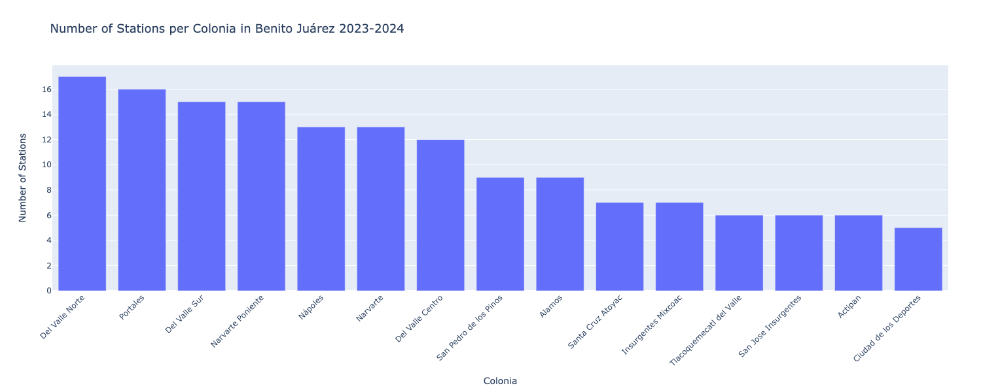

In [ ]:
# Filter data for 'Benito Juárez'
benito_juarez_data = merged_2023_2024_stations[merged_2023_2024_stations['Alcaldia'] == 'Benito Juárez']

# Group by 'Colonia' and count the number of trips
trip_count_per_colonia = benito_juarez_data.groupby('Colonia').size().reset_index(name='Trip_Count')

# Group by 'Colonia' and count the number of unique Station_IDs
station_count_per_colonia = benito_juarez_data.groupby('Colonia')['Station_ID'].nunique().reset_index(name='Station_Count')

# Merge the trip count and station count dataframes
merged_data = trip_count_per_colonia.merge(station_count_per_colonia, on='Colonia')

# Sort the data by trip count and select the top 15 colonias
merged_data = merged_data.sort_values(by='Trip_Count', ascending=False)

# Create a bar chart for trip counts
fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=merged_data['Colonia'],
        y=merged_data['Trip_Count'],
        name='Number of Trips',
        marker_color='blue',
        yaxis='y1'
    )
)

# Add a line for the number of stations
fig.add_trace(
    go.Scatter(
        x=merged_data['Colonia'],
        y=merged_data['Station_Count'],
        mode='lines+markers',
        name='Number of Stations',
        marker_color='red',
        yaxis='y2'
    )
)

# Update layout to include secondary y-axis
fig.update_layout(
    title='Number of Trips and Stations per Colonia in Benito Juárez 2023-2024',
    xaxis=dict(
        title='Colonia',
        tickangle=-45
    ),
    yaxis=dict(
        title='Number of Trips',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title='Number of Stations',
        titlefont=dict(color='red'),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        x=0.1,
        y=1.1,
        orientation='h'
    ),
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

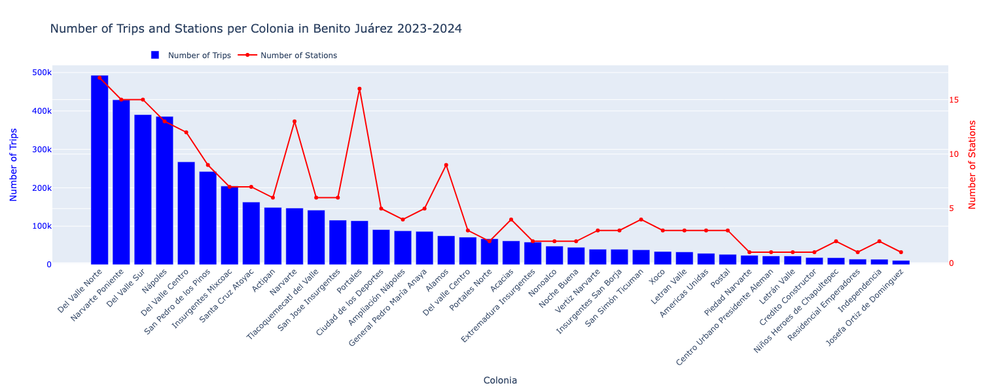

### For the most part, if the number of stations is high than the number of trips will also be high
### Colonias: Narvarte, Portales, Alamos show a high number of stations for example Portales has 16 stations making it the second highest colonia with stations but does not make the top 10 colonias with the highest count of trips
### Narvarte also a very big and popular colonia shows 13 stations tying with Napoles but falls at 10th place for highest trip count

In [ ]:
# Group by 'Colonia' and calculate the average trip duration
avg_trip_duration_per_colonia = benito_juarez_data.groupby('Colonia')['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Sort the data by average trip duration and select the top 15 colonias
avg_trip_duration_per_colonia = avg_trip_duration_per_colonia.sort_values(by='Avg_Trip_Duration', ascending=False)

# Create a bar chart
fig = px.bar(avg_trip_duration_per_colonia, x='Colonia', y='Avg_Trip_Duration', title='Average Trip Duration per Colonia in Benito Juárez 2023-2024', labels={'Colonia': 'Colonia', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

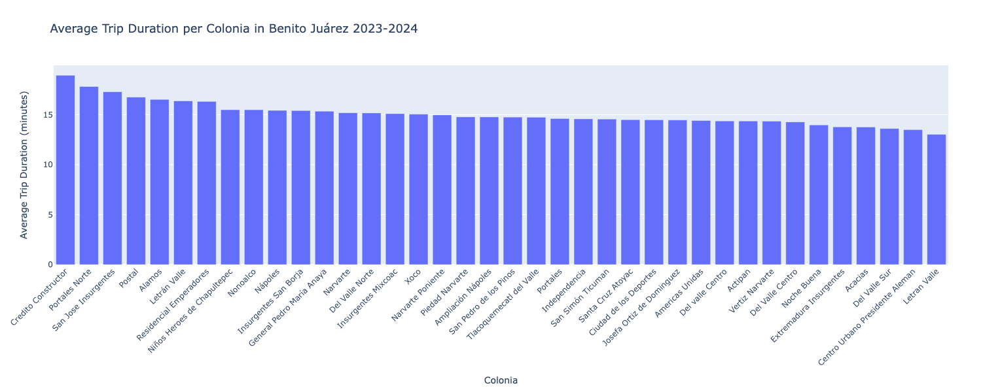

In [ ]:
# Merge the average trip duration and station count dataframes
merged_data = avg_trip_duration_per_colonia.merge(station_count_per_colonia, on='Colonia')

# Sort the data by average trip duration and select the top 15 colonias
merged_data = merged_data.sort_values(by='Avg_Trip_Duration', ascending=False)

# Create a bar chart for average trip duration
fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=merged_data['Colonia'],
        y=merged_data['Avg_Trip_Duration'],
        name='Average Trip Duration',
        marker_color='blue',
        yaxis='y1'
    )
)

# Add a line for the number of stations
fig.add_trace(
    go.Scatter(
        x=merged_data['Colonia'],
        y=merged_data['Station_Count'],
        mode='lines+markers',
        name='Number of Stations',
        marker_color='red',
        yaxis='y2'
    )
)

# Update layout to include secondary y-axis
fig.update_layout(
    title='Average Trip Duration and Number of Stations per Colonia in Benito Juárez 2023-2024',
    xaxis=dict(
        title='Colonia',
        tickangle=-45
    ),
    yaxis=dict(
        title='Average Trip Duration (minutes)',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title='Number of Stations',
        titlefont=dict(color='red'),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        x=0.1,
        y=1.1,
        orientation='h'
    ),
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

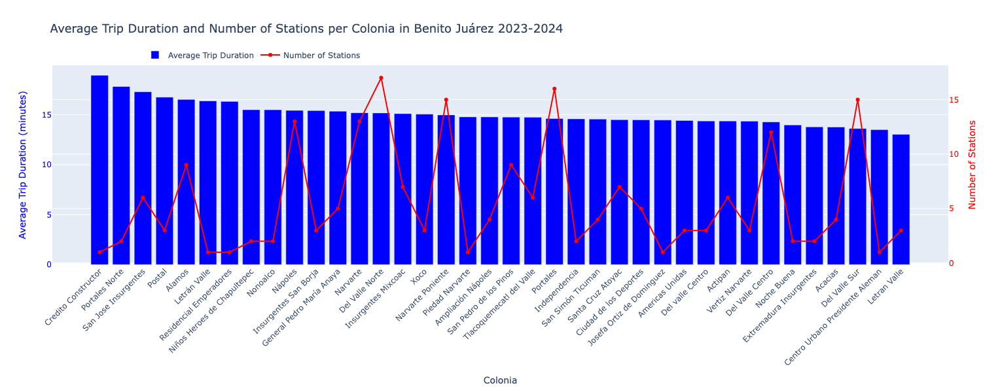

### The first 10 colonias with the exception of Alamos and Napoles show the highest trip duration but low station count

In [ ]:
# Extract coordinates for all unique stations in Benito Juárez
coords = benito_juarez_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Group by 'Station_ID' and calculate the average trip duration for the top 10 stations
avg_trip_duration_per_station = benito_juarez_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')
top_10_stations = avg_trip_duration_per_station.sort_values(by='Avg_Trip_Duration', ascending=False).head(10)

# Generate a color map for the top 10 stations
colors = plt.cm.get_cmap('tab10', 10).colors  # 'tab10' is a colormap with 10 colors
color_map = {station: colors[i] for i, station in enumerate(top_10_stations['Station_ID'])}
color_map_hex = {station: mcolors.rgb2hex(color) for station, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top 10 stations
mean_lat_lon = top_10_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Benito Juárez boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Benito Juárez Area'
).add_to(mymap)

# Add a marker for each of the top 10 stations with color based on Station_ID
for idx, row in top_10_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Avg Trip Duration: {row['Avg_Trip_Duration']:.2f} minutes",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Station_ID']])
    ).add_to(mymap)

# Add a legend for top 10 stations
legend_html = '''
     <div style="position: absolute; 
     top: 50px; left: 50px; width: 250px; height: 390px; 
     background-color: white; z-index:9999; font-size:16px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Top 10 Stations by Avg Trip Duration</b><br>
     '''
for idx, row in top_10_stations.iterrows():
    legend_html += f'<i style="background:{color_map_hex[row["Station_ID"]]}; width: 10px; height: 10px; display: inline-block;"></i> Station {row["Station_ID"]}: {row["Colonia"]}<br>'
legend_html += '</div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

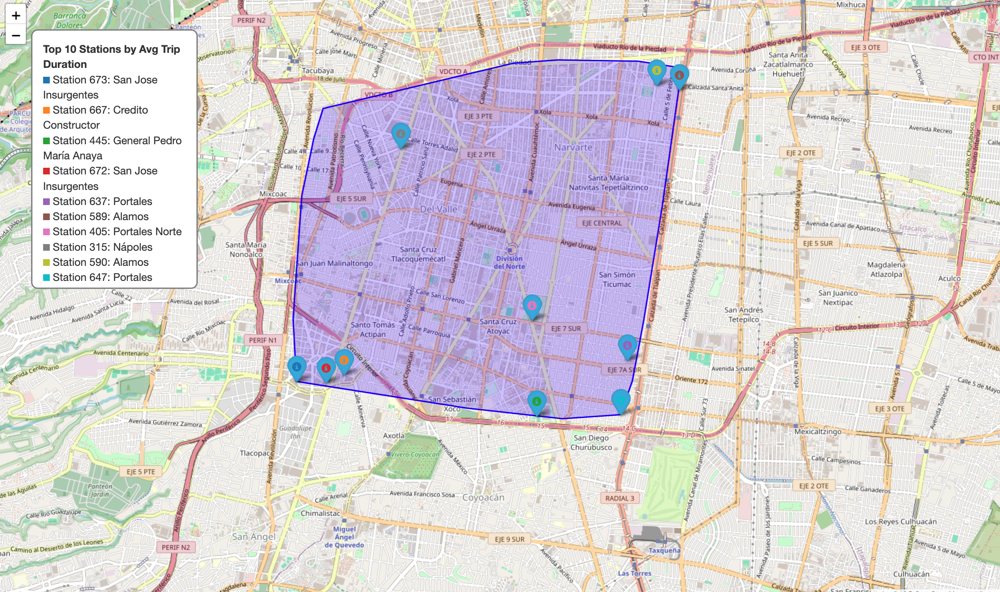

### The above map shows the top 10 stations with the highest trip duration
### We can assume that the reason for higher trip durations is due to the fact that stations are on the limits of Alcadlia Benito Juarez with the exception of a few

In [ ]:
# Extract coordinates for all unique stations in Benito Juárez
coords = benito_juarez_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Group by 'Station_ID' and count the number of trips for the top 15 stations
trip_count_per_station = benito_juarez_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')
top_15_stations = trip_count_per_station.sort_values(by='Trip_Count', ascending=False).head(15)

# Generate a color map for the top 15 stations
colors = plt.cm.get_cmap('tab20', 15).colors  # 'tab20' is a colormap with 20 colors
color_map = {station: colors[i] for i, station in enumerate(top_15_stations['Station_ID'])}
color_map_hex = {station: mcolors.rgb2hex(color) for station, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top 15 stations
mean_lat_lon = top_15_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Benito Juárez boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Benito Juárez Area'
).add_to(mymap)

# Add a marker for each of the top 15 stations with color based on Station_ID
for idx, row in top_15_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Trip Count: {row['Trip_Count']}",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Station_ID']])
    ).add_to(mymap)

# Add a legend for top 15 stations
legend_html = '''
     <div style="position: absolute; 
     top: 50px; left: 50px; width: 250px; height: 570px; 
     background-color: white; z-index:9999; font-size:16px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Top 15 Stations by Trip Count</b><br>
     '''
for idx, row in top_15_stations.iterrows():
    legend_html += f'<i style="background:{color_map_hex[row["Station_ID"]]}; width: 10px; height: 10px; display: inline-block;"></i> Station {row["Station_ID"]}: {row["Colonia"]}<br>'
legend_html += '</div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

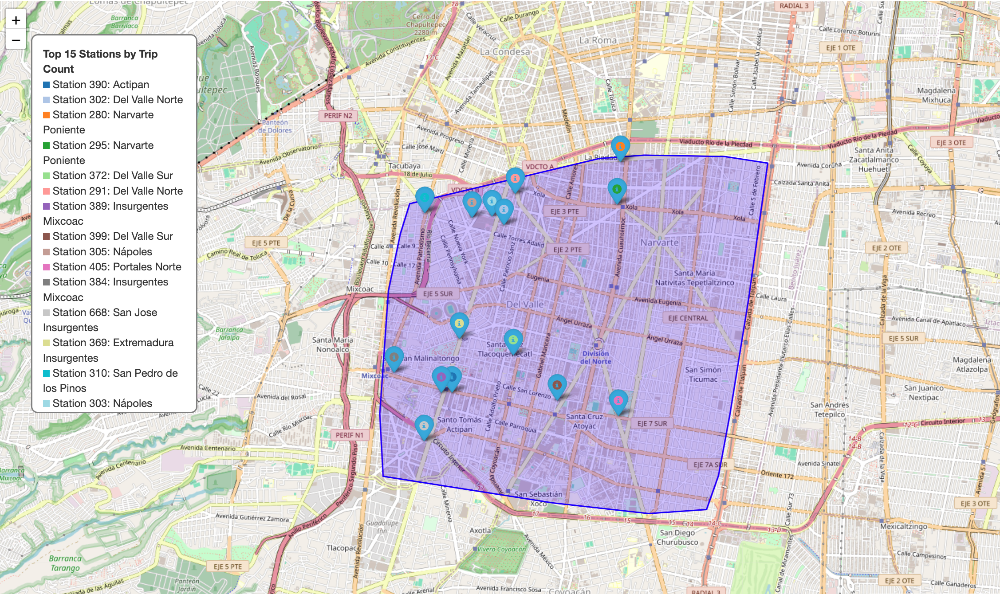

### The above map shows that the stations with the highest trip count are mostly located on the north and west side of benito juarez and not one stations is found on the east of Benito Juarez
### The stations are also found on main avenues and not secondary streets
### 6 stations are found on avenida insurgentes which I mentioned earlier that it is a very busy avenue and bike friendly

In [ ]:
# Group by 'Month' and 'Colonia' and count the number of trips
trip_count_per_month_colonia = benito_juarez_data.groupby(['Month', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 5 colonias for each month
top_10_colonias_per_month = trip_count_per_month_colonia.groupby('Month').apply(lambda x: x.nlargest(10, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart
fig = px.bar(top_10_colonias_per_month, x='Month', y='Trip_Count', color='Colonia', barmode='group',
             title='Top 10 Colonias by Number of Trips per Month in Benito Juárez 2023-2024',
             labels={'Month': 'Month', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Update x-axis ticks to show month names
fig.update_xaxes(tickmode='array', tickvals=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                 ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Show the plot
fig.show()

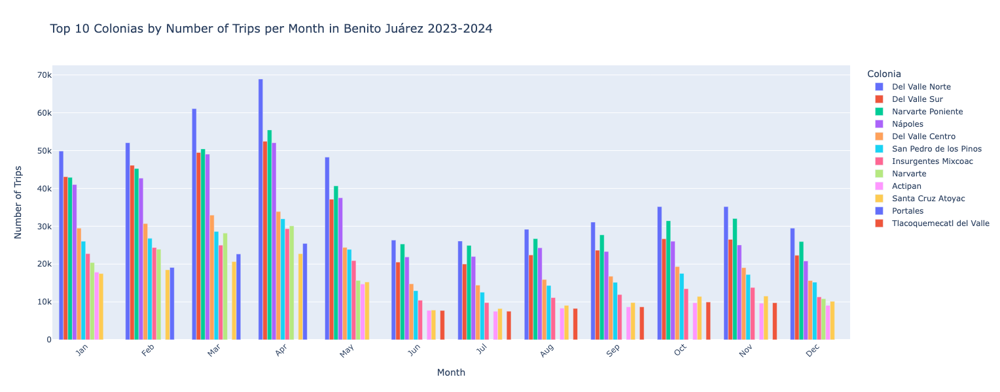

### Colonia del Valle norte leads every single month, followed by del valle sur and Narvarte Poniente
### April showed the highest month for trips for each colonia 
### June showed the least monthly trips for the top 10 colonias in Benito Juarez

In [ ]:
# Extract the unique colonias from the top 10 per month
top_colonias = top_10_colonias_per_month['Colonia'].unique()

# Filter the original data to include only these top colonias
filtered_data = benito_juarez_data[benito_juarez_data['Colonia'].isin(top_colonias)]

# Count the number of unique stations for each colonia
unique_stations_per_colonia = filtered_data.groupby('Colonia')['Station_ID'].nunique().reset_index(name='Unique_Stations')

# Create a bar chart for the number of unique stations per colonia
fig2 = px.bar(unique_stations_per_colonia, x='Colonia', y='Unique_Stations', color='Colonia',
              title='Number of Stations per Colonia',
              labels={'Colonia': 'Colonia', 'Unique_Stations': 'Number of Unique Stations'})

# Customize the layout for better readability
fig2.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Number of Unique Stations',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot for number of unique stations per colonia
fig2.show()


# Calculate the average trip duration for each colonia
avg_trip_duration_per_colonia = filtered_data.groupby('Colonia')['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Merge the unique stations and average trip duration data
merged_data = unique_stations_per_colonia.merge(avg_trip_duration_per_colonia, on='Colonia')

# Create the figure
fig = go.Figure()

# Add bar trace for the number of unique stations
fig.add_trace(go.Bar(
    x=merged_data['Colonia'],
    y=merged_data['Unique_Stations'],
    name='Number of Unique Stations',
    yaxis='y1',
    marker=dict(color='rgb(55, 83, 109)')
))

# Add line trace for the average trip duration
fig.add_trace(go.Scatter(
    x=merged_data['Colonia'],
    y=merged_data['Avg_Trip_Duration'],
    name='Average Trip Duration',
    yaxis='y2',
    mode='lines+markers',
    line=dict(color='rgb(26, 118, 255)')
))

# Update layout for the dual-axis
fig.update_layout(
    title='Number of Stations and Average Trip Duration per Colonia',
    xaxis=dict(title='Colonia'),
    yaxis=dict(
        title='Number of Unique Stations',
        titlefont=dict(color='rgb(55, 83, 109)'),
        tickfont=dict(color='rgb(55, 83, 109)')
    ),
    yaxis2=dict(
        title='Average Trip Duration (minutes)',
        titlefont=dict(color='rgb(26, 118, 255)'),
        tickfont=dict(color='rgb(26, 118, 255)'),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        x=0.1,
        y=1.1,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()


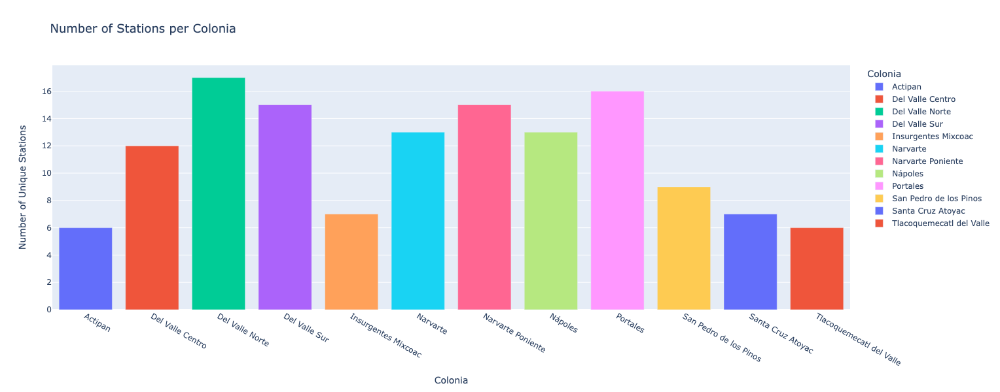

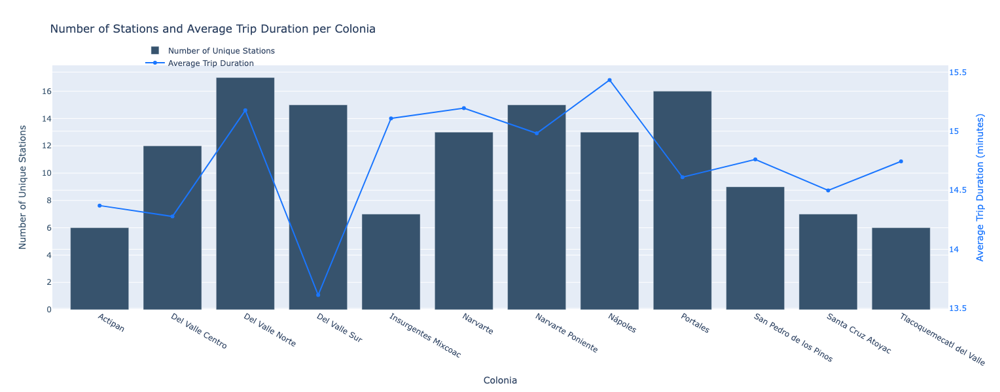

### The top colonias with most trips per month show a range number of stations from 6 being the least and 17 being the most
### Insurgentes mixcoac which has only 7 stations records the 4th highest trip duration
### In some cases, an increase in bike stations depending on the size of the colonia or an increase in bike docks for each station could benefit more users and increase trip durations

In [ ]:
# Calculate the total trip count for each colonia
total_trip_count_per_colonia = filtered_data.groupby('Colonia').size().reset_index(name='Total_Trip_Count')

# Merge the unique stations and total trip count data
merged_data = unique_stations_per_colonia.merge(total_trip_count_per_colonia, on='Colonia')

# Create the figure
fig = go.Figure()

# Add bar trace for the number of unique stations
fig.add_trace(go.Bar(
    x=merged_data['Colonia'],
    y=merged_data['Unique_Stations'],
    name='Number of Unique Stations',
    yaxis='y1',
    marker=dict(color='rgb(55, 83, 109)')
))

# Add line trace for the total trip count
fig.add_trace(go.Scatter(
    x=merged_data['Colonia'],
    y=merged_data['Total_Trip_Count'],
    name='Total Trip Count',
    yaxis='y2',
    mode='lines+markers',
    line=dict(color='rgb(26, 118, 255)')
))

# Update layout for the dual-axis
fig.update_layout(
    title='Number of Stations and Total Trip Count per Colonia',
    xaxis=dict(title='Colonia'),
    yaxis=dict(
        title='Number of Unique Stations',
        titlefont=dict(color='rgb(55, 83, 109)'),
        tickfont=dict(color='rgb(55, 83, 109)')
    ),
    yaxis2=dict(
        title='Total Trip Count',
        titlefont=dict(color='rgb(26, 118, 255)'),
        tickfont=dict(color='rgb(26, 118, 255)'),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        x=0.1,
        y=1.1,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

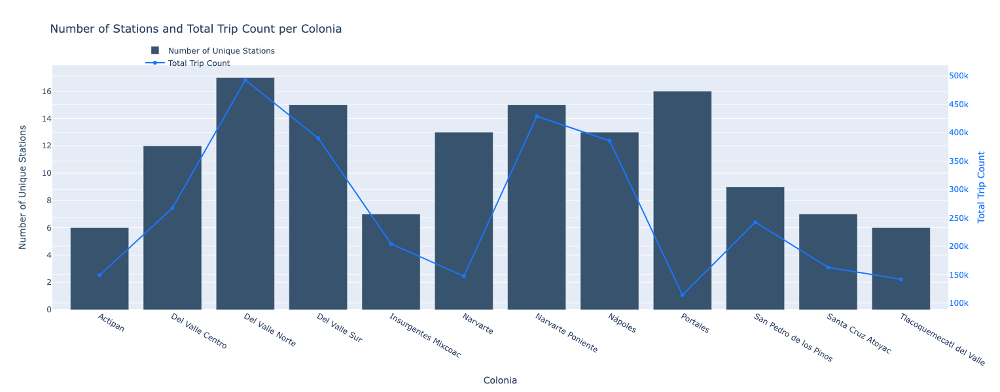

### Colonias such as Actipan, Insurgentes Mixcoac, Santa Cruz Atoyac, and Tlacoquemecatl Del Valle, which currently have a low number of stations and trips, may benefit from an increased number of bike docks.
### The low number of trips and stations in these colonias could be attributed to their proximity to larger, more densely populated areas with higher trip counts.
### Despite having a high number of stations, Portales and Narvarte show surprisingly low trip counts. 
### This may be due to factors such as poor street conditions, lack of bike lanes, or higher crime rates, making these areas less safe and bike-friendly.